*Internal Note:* 

- *The following is a tutorial template to be used by PO.DAAC staff when developing end-user tutorials.*
- *Copy this template and edit to create your notebook, keeping as many key elements as appropriate.*
- *DO NOT modify this template to create a tutorial. If you wish to make suggestions to improve the template please submit a PR and tag Catalina Oaida Taglialatela (ScienceCat18)*

> From the PO.DAAC Cookbook, to access the GitHub version of the notebook, follow [this link](insert link to notebook).

# SWOT Hydro Science Application Tutorial
#### *Authors: Cerbelaud A., Wade J., Jet Propulsion Laboratory - Caltech*

## Summary

_[Add summary/tutorial description here]_

## Requirements

### 1. Compute environment 
*internal note (remove this note in final tutorial): keep one or both of these Req 1 depending on environment required to run the noteook*

This tutorial can be run in the following environments:
- **AWS instance running in us-west-2**: NASA Earthdata Cloud data in S3 can be directly accessed via temporary credentials; this access is limited to requests made within the US West (Oregon) (code: `us-west-2`) AWS region.
- **Local compute environment** e.g. laptop, server: this tutorial can be run on your local machine

### 2. Earthdata Login

An Earthdata Login account is required to access data, as well as discover restricted data, from the NASA Earthdata system. Thus, to access NASA data, you need Earthdata Login. Please visit https://urs.earthdata.nasa.gov to register and manage your Earthdata Login account. This account is free to create and only takes a moment to set up.

### 3. Additional Requirements

Any other requirements needed for reproducing this tutorial.

## Learning Objectives
- enter objective 
- enter objective 
- ...

------

## Import Packages

In [54]:
import glob
import os
import requests
import s3fs
import fiona
import netCDF4 as nc
import h5netcdf
import xarray as xr
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import hvplot.xarray
import earthaccess
from earthaccess import Auth, DataCollections, DataGranules, Store
from pathlib import Path
import zipfile

## Authenticate
Authenticate your Earthdata Login (EDL) information using the `earthaccess` python package as follows:

In [2]:
earthaccess.login() # Login with your EDL credentials if asked

EARTHDATA_USERNAME and EARTHDATA_PASSWORD are not set in the current environment, try setting them or use a different strategy (netrc, interactive)
No .netrc found in /home/jovyan


Enter your Earthdata Login username:  cerbelaud
Enter your Earthdata password:  ········


You're now authenticated with NASA Earthdata Login
Using token with expiration date: 03/10/2024
Using user provided credentials for EDL


In [55]:
#Retrieves granule from the day we want, in this case by passing to `earthdata.search_data` function the data collection shortname, temporal bounds, and for restricted data one must specify the search count
river_results = earthaccess.search_data(short_name = 'SWOT_L2_HR_RIVERSP_1.1', 
                                        temporal = ('2023-04-08 00:00:00', '2023-04-10 23:59:59'),
                                        #granule_name = '*Reach*_003_EU*') # here we filter by Reach files (not node), pass #13 and continent code=NA
                                        granule_name = '*Reach*_009_NA*') # here we filter by Reach files (not node), pass #13 and continent code=NA


Granules found: 3


In [56]:
fs_s3 = earthaccess.get_s3fs_session(results=river_results)
fiona_session=fiona.session.AWSSession(
        aws_access_key_id=fs_s3.storage_options["key"],
        aws_secret_access_key=fs_s3.storage_options["secret"],
        aws_session_token=fs_s3.storage_options["token"]
    )

In [57]:
# Initialize list to shp files
SWOT_HR_shps = []

# Loop through queried granules to stack all acquisition dates
for j in range(len(river_results)):
    
    # Get the link for each zip file
    river_link = earthaccess.results.DataGranule.data_links(river_results[j], access='direct')[0]
    
    # We use the zip+ prefix so fiona knows that we are operating on a zip file
    river_shp_url = f"zip+{river_link}"
    
    # Read shapefile
    with fiona.Env(session=fiona_session):
        SWOT_HR_shps.append(gpd.read_file(river_shp_url)) 

In [58]:
# Combine granules from time steps into one dataframe
SWOT_HR_df = gpd.GeoDataFrame(pd.concat(SWOT_HR_shps, ignore_index=True))

# Sort dataframe by reach_id and time
SWOT_HR_df = SWOT_HR_df.sort_values(['reach_id', 'time'])

SWOT_HR_df

,reach_id,time,time_tai,time_str,p_lat,p_lon,river_name,wse,wse_u,wse_r_u,...,p_wid_var,p_n_nodes,p_dist_out,p_length,p_maf,p_dam_id,p_n_ch_max,p_n_ch_mod,p_low_slp,geometry
1284,72270800253,-1.000000e+12,-1.000000e+12,no_data,57.494263,-65.961145,no_data,-1.000000e+12,-1.000000e+12,-1.000000e+12,...,77996.769,39,133892.477,7856.891046,-1.000000e+12,0,2,1,0,"LINESTRING (-66.00017 57.51990, -65.99950 57.5..."
1285,72270800261,-1.000000e+12,-1.000000e+12,no_data,57.462952,-65.919472,no_data,-1.000000e+12,-1.000000e+12,-1.000000e+12,...,8618.471,6,135068.918,1176.441581,-1.000000e+12,0,1,1,0,"LINESTRING (-65.92132 57.46728, -65.92109 57.4..."
1286,72270800273,-1.000000e+12,-1.000000e+12,no_data,57.451213,-65.910629,no_data,-1.000000e+12,-1.000000e+12,-1.000000e+12,...,6374.566,9,136792.141,1723.222485,-1.000000e+12,0,2,1,0,"LINESTRING (-65.91688 57.45794, -65.91676 57.4..."
1287,72270800281,-1.000000e+12,-1.000000e+12,no_data,57.419244,-65.892484,no_data,-1.000000e+12,-1.000000e+12,-1.000000e+12,...,4576.025,34,143494.604,6702.462983,-1.000000e+12,0,3,1,0,"LINESTRING (-65.90410 57.44449, -65.90418 57.4..."
1288,72270800291,-1.000000e+12,-1.000000e+12,no_data,57.399582,-65.913297,no_data,-1.000000e+12,-1.000000e+12,-1.000000e+12,...,4936.740,2,143879.351,384.747359,-1.000000e+12,0,1,1,0,"LINESTRING (-65.90973 57.39944, -65.91023 57.3..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1282,73130000054,-1.000000e+12,-1.000000e+12,no_data,41.382209,-73.172231,Housatonic River,-1.000000e+12,-1.000000e+12,-1.000000e+12,...,10522.698,2,30857.397,389.417460,-1.000000e+12,19700,2,1,0,"LINESTRING (-73.16973 41.38169, -73.17009 41.3..."
1956,73130000054,-1.000000e+12,-1.000000e+12,no_data,41.382209,-73.172231,Housatonic River,-1.000000e+12,-1.000000e+12,-1.000000e+12,...,10522.698,2,30857.397,389.417460,-1.000000e+12,19700,2,1,0,"LINESTRING (-73.16973 41.38169, -73.17009 41.3..."
615,73130000061,-1.000000e+12,-1.000000e+12,no_data,41.424945,-73.230960,Housatonic River,-1.000000e+12,-1.000000e+12,-1.000000e+12,...,10469.706,82,47161.191,16303.793847,-1.000000e+12,0,2,1,0,"LINESTRING (-73.17436 41.38295, -73.17465 41.3..."
1283,73130000061,-1.000000e+12,-1.000000e+12,no_data,41.424945,-73.230960,Housatonic River,-1.000000e+12,-1.000000e+12,-1.000000e+12,...,10469.706,82,47161.191,16303.793847,-1.000000e+12,0,2,1,0,"LINESTRING (-73.17436 41.38295, -73.17465 41.3..."


## Exploring the dataset

In [59]:
# What acquisition dates and rivers do we have?

print('Available dates are:')
print(np.unique([i[:10] for i in SWOT_HR_df['time_str']]))
print('Available rivers are:')
print(np.unique([i for i in SWOT_HR_df['river_name']]))

Available dates are:
['2023-04-08' '2023-04-09' '2023-04-10' 'no_data']
Available rivers are:
['Allagash River' 'Androscoggin River' 'Big Black River' 'Canal de fuite'
 'Carrabassett River' 'Concord River' 'Concord River; Sudbury River'
 'Connecticut River' 'Connecticut River; Westfield River'
 'Connecticut River; White River' 'Dead River'
 'Dead River (Kennebec River)' 'Deerfield River' 'Farmington River'
 'Housatonic River' 'Ikarut River' 'Kennebec River' 'Komaktorvik River'
 'Magalloway River' 'Merrimack River' 'Moose River'
 'North Branch Penobscot River' 'Passumsic River' 'Pemigewasset River'
 'Penobscot River West Branch' 'Quinebaug River' 'Saco River'
 'Saguenay River' 'Saint Francis River' 'Saint John River'
 'Saint Lawrence River' 'Sandy River' 'Shetucket River' 'Sudbury River'
 'Thames River' 'West River' 'White River' 'no_data']


In [60]:
## Filter dataframe by river name of interest:
## Note: Some rivers have multiple names, hence using the `contains` function

SWOT_HR_df_river = SWOT_HR_df[(SWOT_HR_df.river_name.str.contains("Connecticut River"))]   # "Rhine", "Connecticut River"

# Plot geopandas dataframe with 'explore'

SWOT_HR_df_river.explore()

In [9]:
## Filter dataframe by lat/lon

lat_start = 47.5
lat_end   = 51
lon_start = 7
lon_end   = 10

SWOT_HR_df_box = SWOT_HR_df[(SWOT_HR_df.p_lat > lat_start) & (SWOT_HR_df.p_lat < lat_end) & (SWOT_HR_df.p_lon > lon_start) & (SWOT_HR_df.p_lon < lon_end)]

# Plot geopandas dataframe with 'explore'
SWOT_HR_df_box.explore()

### Trace reaches downstream of starting reach using `rch_id_dn` field (J. Wade)

#### WARNING: This works as long as the data is exhaustive (no missing reaches)

In [61]:
# Format rch_id_dn for dictionary. Rch_id_dn allows for multiple downstream reaches to be stored
# Also removes spaces in attribute field
rch_id_dn = [[x.strip() for x in SWOT_HR_df.rch_id_dn[j].split(',')] for j in range(0,len(SWOT_HR_df.rch_id_dn))]

# Filter upstream reach ids to remove 'no_data'
rch_id_dn_filter = [[x for x in dn_id if x.isnumeric()] for dn_id in rch_id_dn]

# Create lookup dictionary for river network topology: Downstream
rch_dn_dict = {SWOT_HR_df.reach_id[i]: rch_id_dn_filter[i] for i in range(len(SWOT_HR_df))}

In [79]:
# Set starting reach_id: Headwaters of the Rhine/Connecticut River
rch_dn_st = '73120000691'    # '23267000651', '73120000691'

# Initialize list to store downstream reaches, including starting reach
rch_dn_list = [rch_dn_st]
# Retrieve first downstream id of starting reach and add to list
rch_dn_next = rch_dn_dict[rch_dn_st][0]

# Trace next downstream reach until we hit the outlet (or here the last reach on file)
while len(rch_dn_next) != 0:
    # Add reach to list if value exists
    if len(rch_dn_next) != 0:
        rch_dn_list.append(rch_dn_next)
    # Recursively retrieve first downstream id of next reach
    # Catch error if reach isn't in downloaded data
    try:
        rch_dn_next = rch_dn_dict[rch_dn_next][0]
    except:
        break

In [80]:
# Filter downloaded data by traced reaches
SWOT_dn_trace = SWOT_HR_df[SWOT_HR_df.reach_id.isin(rch_dn_list)]

# Remove reaches from rch_dn_list that are not present in SWOT data
rch_dn_list = [rch for rch in rch_dn_list if rch in SWOT_HR_df.reach_id.values]

SWOT_dn_trace.explore()

### Trace reaches upstream of starting reach using `rch_id_up` field (J. Wade)

#### WARNING: This works as long as the data is exhaustive (no missing reaches)

In [64]:
# Format rch_id_up for dictionary. Rch_id_up allows for multiple upstream reaches to be stored
# Also removes spaces in attribute field
rch_id_up = [[x.strip() for x in SWOT_HR_df.rch_id_up[j].split(',')] for j in range(0,len(SWOT_HR_df.rch_id_up))]

# Filter upstream reach ids to remove 'no_data'
rch_id_up_fil = [[x for x in ups_id if x.isnumeric()] for ups_id in rch_id_up]

# Create lookup dictionary for river network topology: Upstream
rch_up_dict = {SWOT_HR_df.reach_id[i]: rch_id_up_fil[i] for i in range(len(SWOT_HR_df))}

In [81]:
# Set starting reach_id: "Outlet" of the Rhine/Connecticut River
rch_up_st = '73120000013'    # '23265000051', '73120000013'

# Initialize list to store traced upstream reaches, including starting reach
rch_up_list = [rch_up_st]
# Retrieve ids of reaches upstream of starting reach and add to list
rch_up_next = rch_up_dict[rch_up_st]
# For upstream tracing, we need to set a list of next upstream ids to start while loop
rch_next_id = rch_up_next

# Loop until no more reaches to trace
while len(rch_next_id) != 0:
    # Initialize list to store next upstream ids
    rch_next_id = []
    # Loop through next upstream ids for given reach
    for rch_up_sel in rch_up_next:
        # Get values of existing upstream ids of rch_up_next reaches
        # If reach isn't in SWOT data (usually ghost reaches), continue to next reach
        try:
            rch_next_id = rch_next_id + rch_up_dict[rch_up_sel]
        except:
            continue
        # Append id to list
        rch_up_list.append(rch_up_sel)
    # If reaches exist, add to list for next cycle of tracing
    if len(rch_next_id) != 0:
        rch_up_next = rch_next_id

In [82]:
# Filter downloaded data by upstream traced reaches
SWOT_up_trace = SWOT_HR_df[SWOT_HR_df.reach_id.isin(rch_up_list)]

# Remove reaches from rch_up_list that are not present in SWOT data
rch_up_list = [rch for rch in rch_up_list if rch in SWOT_HR_df.reach_id.values]

SWOT_up_trace.explore()

### Plot a time series of WSE/width/slope longitudinal profiles

In [83]:
# Retrieve all possible acquisition dates (keeping only YYYY-MM-DD)
dates = np.unique([i[:10] for i in [x for x in SWOT_HR_df['time_str'] if x!='no_data']])

# Create a new database for time series analysis with unique reach_ids
SWOT_dn_trace_time = SWOT_dn_trace.set_index('reach_id').groupby(level=0) \
                                  .apply(lambda df: df.reset_index(drop=True)) \
                                  .unstack().sort_index(axis=1, level=1)

SWOT_dn_trace_time.columns = ['{}_{}'.format(x[0],dates[x[1]]) for x in SWOT_dn_trace_time.columns]

SWOT_dn_trace_time

,area_det_u_2023-04-08,area_detct_2023-04-08,area_tot_u_2023-04-08,area_total_2023-04-08,area_wse_2023-04-08,d_x_area_2023-04-08,d_x_area_u_2023-04-08,dark_frac_2023-04-08,dry_trop_c_2023-04-08,dschg_b_2023-04-08,...,width_c_u_2023-04-10,width_u_2023-04-10,wse_2023-04-10,wse_c_2023-04-10,wse_c_u_2023-04-10,wse_r_u_2023-04-10,wse_u_2023-04-10,xovr_cal_c_2023-04-10,xovr_cal_q_2023-04-10,xtrk_dist_2023-04-10
reach_id,,,,,,,,,,,,,,,,,,,,,
73120000013,1.000000e+12,0.0,1.000000e+12,0.0,0.0,-1.000000e+12,-1.000000e+12,NaN,-2.352779,-1.000000e+12,...,-1.000000e+12,4.026091,-1.000000e+12,-1.000000e+12,-1.000000e+12,-1.000000e+12,-1.000000e+12,-0.021845,2,1068.68787
73120000021,1.009726e+06,11163428.2,1.009726e+06,15304786.0,15304786.0,-1.000000e+12,-1.000000e+12,0.270592,-2.352712,-1.000000e+12,...,-1.000000e+12,48.891717,9.448300e+00,-1.000000e+12,-1.000000e+12,2.046000e+00,2.047980e+00,0.010698,0,-4196.11218
73120000031,3.506820e+04,6096495.8,3.506824e+04,6171170.3,6171170.3,-1.000000e+12,-1.000000e+12,0.012101,-2.353593,-1.000000e+12,...,-1.000000e+12,3.186908,1.048610e+01,-1.000000e+12,-1.000000e+12,9.645000e-02,1.319200e-01,0.031468,0,-8870.68457
73120000041,1.916590e+04,4567086.5,1.916592e+04,4679930.7,4679930.7,-1.000000e+12,-1.000000e+12,0.024112,-2.354104,-1.000000e+12,...,-1.000000e+12,1.685894,3.555000e-01,-1.000000e+12,-1.000000e+12,1.075900e-01,1.402700e-01,0.065970,0,-13994.41504
73120000051,2.113390e+04,6803165.6,2.113389e+04,6982554.7,6982554.7,-1.000000e+12,-1.000000e+12,0.025691,-2.353600,-1.000000e+12,...,-1.000000e+12,1.005337,3.783900e+00,-1.000000e+12,-1.000000e+12,1.390700e-01,1.656500e-01,0.101984,0,-22455.17773
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
73120000651,1.605210e+04,2324657.6,1.605208e+04,2368409.6,2368409.6,-1.000000e+12,-1.000000e+12,0.018473,-2.277401,-1.000000e+12,...,-1.000000e+12,0.534520,2.562646e+02,-1.000000e+12,-1.000000e+12,5.573200e-01,5.645400e-01,0.112778,0,-24971.14551
73120000661,1.442690e+04,2138683.8,1.442686e+04,2166784.7,2166784.7,-1.000000e+12,-1.000000e+12,0.012969,-2.277232,-1.000000e+12,...,-1.000000e+12,0.420088,2.584388e+02,-1.000000e+12,-1.000000e+12,5.800900e-01,5.870300e-01,0.116936,0,-26103.32422
73120000671,1.501230e+04,2194380.3,1.501235e+04,2199011.7,2199011.7,-1.000000e+12,-1.000000e+12,0.002106,-2.276435,-1.000000e+12,...,-1.000000e+12,0.551025,2.602509e+02,-1.000000e+12,-1.000000e+12,3.761400e-01,3.867600e-01,0.134078,0,-29969.06641


In [91]:
# Choose wanted variables
for var in ["wse","slope","width","len"]:
    print(SWOT_dn_trace.columns[SWOT_dn_trace.columns.str.contains(var)])
    
varstr = "wse"

Index(['wse', 'wse_u', 'wse_r_u', 'wse_c', 'wse_c_u', 'area_wse', 'p_wse',
       'p_wse_var'],
      dtype='object')
Index(['slope', 'slope_u', 'slope_r_u', 'slope2', 'slope2_u', 'slope2_r_u'], dtype='object')
Index(['width', 'width_u', 'width_c', 'width_c_u', 'p_width'], dtype='object')
Index(['p_length'], dtype='object')


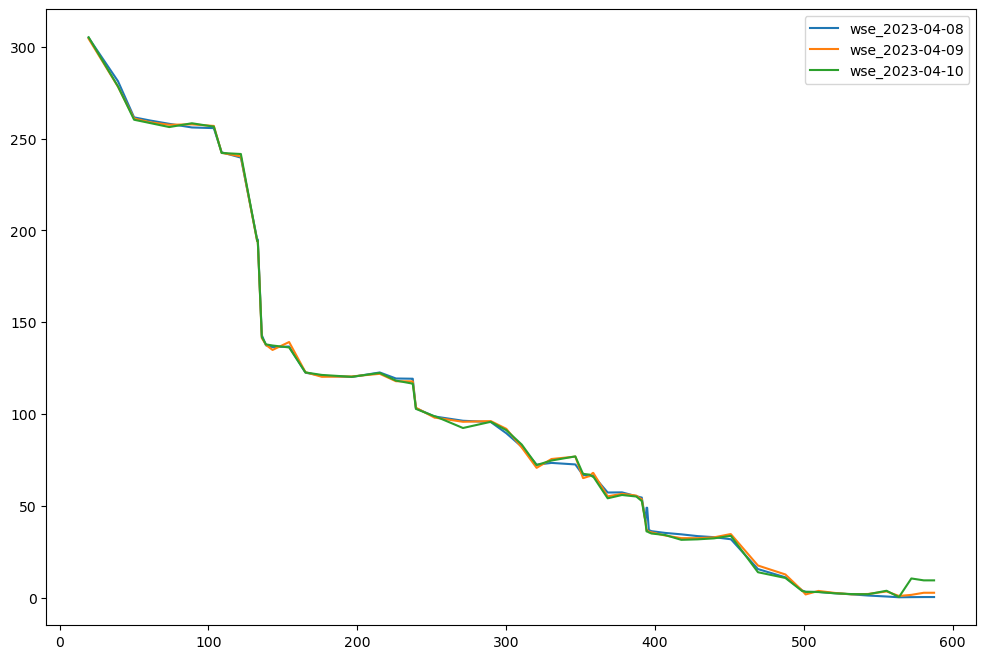

In [92]:
# Find cumulative length on the longitudinal profile

length_list    = np.nan_to_num([SWOT_dn_trace.p_length[SWOT_dn_trace.reach_id == rch].mean()/1000 for rch in rch_dn_list])
cumlength_list = np.cumsum(length_list)

## Plot a longitudinal profile from the downstream tracing database

## Plot a longitudinal profile from the downstream tracing database
plt.figure(figsize=(12,8))
for t in dates:
    
    # Store the quantity of interest (wse, width etc.) at time t
    value = SWOT_dn_trace_time.loc[rch_dn_list,varstr+'_'+t]
    
    # Remove set negative values (bad observations) to NaN and forward fill NaNs
    value[value < 0] = np.nan
    value = value.ffill()
    
    
    # Plot the data
    plt.plot(cumlength_list, value, label = varstr+'_'+t)
    
plt.legend()

### Plot a (animated?) interactive map of WSE/width/slope
#### Ongoing work

In [93]:
date = dates[0]

#Set one column as the active geometry in the new database
SWOT_dn_trace_time = SWOT_dn_trace_time.set_geometry("geometry_"+date)

vmin = np.percentile([i for i in SWOT_dn_trace_time[varstr+'_'+date] if i>0],5)
vmax = np.percentile([i for i in SWOT_dn_trace_time[varstr+'_'+date] if i>0],95)
SWOT_dn_trace_time.explore(varstr+'_'+date,
                           vmin = vmin,
                           vmax = vmax,
                           cmap = "Blues", #"Blues",
                           control_scale = True,
                           tooltip = varstr+'_'+dates[0],  # show "varstr+'_'+dates[0]" value in tooltip (on hover)
                           popup = True,  # show all values in popup (on click)
                           tiles = "CartoDB positron",  # use "CartoDB positron" tiles
                           style_kwds=dict(weight=10)
                          )